Code for **"Inpainting"** figures $6$, $8$ and 7 (top) from the main paper. 

In [1]:
"""
*Uncomment if running on colab* 
Set Runtime -> Change runtime type -> Under Hardware Accelerator select GPU in Google Colab 
"""
!git clone https://github.com/DmitryUlyanov/deep-image-prior
!mv deep-image-prior/* ./

fatal: destination path 'deep-image-prior' already exists and is not an empty directory.
mv: cannot stat 'deep-image-prior/*': No such file or directory


# Import libs

In [41]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '1'

import numpy as np
from models.resnet import ResNet
from models.unet import UNet
from models.skip import skip
import torch
import torch.optim

from utils.inpainting_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

PLOT = True
imsize = -1
dim_div_by = 64

# Choose figure

In [42]:
## Fig 6
#img_path  = 'data/inpainting/vase.png'
#mask_path = 'data/inpainting/vase_mask.png'

## Fig 8
# img_path  = 'data/inpainting/library.png'
# mask_path = 'data/inpainting/library_mask.png'

## Fig 7 (top)
img_path  = 'data/inpainting/kate.png'
mask_path = 'data/inpainting/kate_mask.png'

# Another text inpainting example
# img_path  = 'data/inpainting/peppers.png'
# mask_path = 'data/inpainting/peppers_mask.png'

NET_TYPE = 'skip_depth6' # one of skip_depth4|skip_depth2|UNET|ResNet

In [ ]:
images = [{'data/inpainting/vase.png':'data/inpainting/vase_mask.png'},{'data/inpainting/library.png':'data/inpainting/library_mask.png'},{'data/inpainting/kate.png':'data/inpainting/kate_mask.png'},{'data/inpainting/peppers.png':'data/inpainting/peppers_mask.png'}]

# Load mask

In [43]:
img_pil, img_np = get_image(img_path, imsize)
img_mask_pil, img_mask_np = get_image(mask_path, imsize)



### Center crop

In [44]:
img_mask_pil = crop_image(img_mask_pil, dim_div_by)
img_pil      = crop_image(img_pil,      dim_div_by)

img_np      = pil_to_np(img_pil)
img_mask_np = pil_to_np(img_mask_pil)



### Visualize

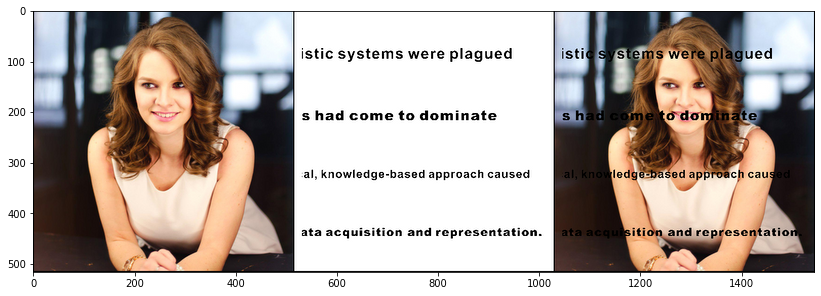

In [45]:
img_mask_var = np_to_torch(img_mask_np).type(dtype)

plot_image_grid([img_np, img_mask_np, img_mask_np*img_np], 3,11);

# Setup

In [46]:
pad = 'reflection' # 'zero'
OPT_OVER = 'net'
OPTIMIZER = 'adam'

In [47]:
LR = None
num_iter = None
reg_noise_std = None


def process():
    # Same params and net as in super-resolution and denoising
    INPUT = 'noise'
    #input_depth = 32
    #LR = 0.01 
    #num_iter = 6001
    param_noise = False
    show_every = 50
    figsize = 5
    #reg_noise_std = 0.03
    
    net = skip(input_depth, img_np.shape[0], 
              num_channels_down = [128] * 5,
              num_channels_up =   [128] * 5,
              num_channels_skip =    [128] * 5,  
              filter_size_up = 3, filter_size_down = 3, 
              upsample_mode='nearest', filter_skip_size=1,
              need_sigmoid=True, need_bias=True, pad=pad, act_fun='LeakyReLU').type(dtype)

LR_param = [0.005, 0.01, 0.02, 0.03, ]
num_iter_param = [5001, 6001, 7001,]
reg_noise_std_param = [0.02, 0.03, 0.04]


for LR in LR_param:

for num_iter in num_iter_param:

for reg_noise_std in reg_noise_std_param:



In [ ]:
# Compute number of parameters
s  = sum(np.prod(list(p.size())) for p in net.parameters())
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_var = np_to_torch(img_np).type(dtype)
mask_var = np_to_torch(img_mask_np).type(dtype)

# Main loop

Starting optimization with ADAM


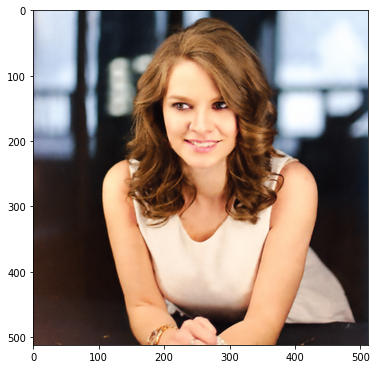

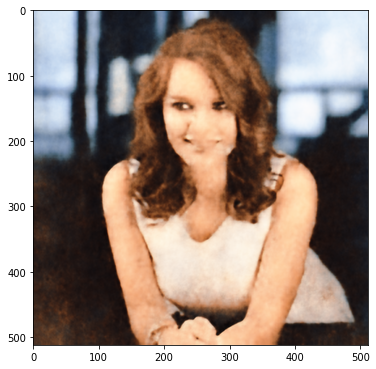

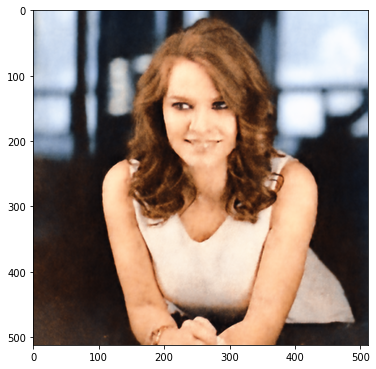

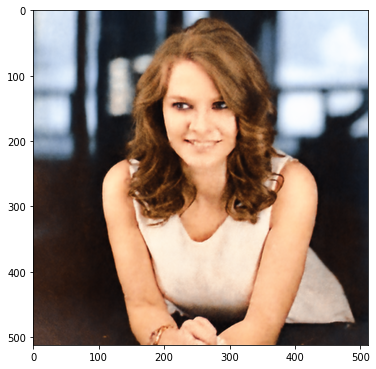

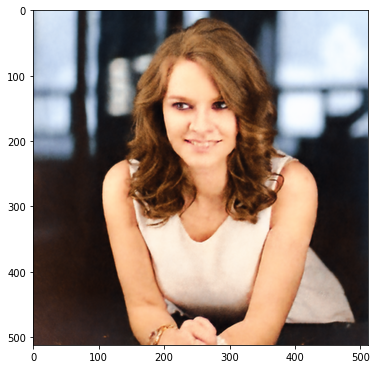

...

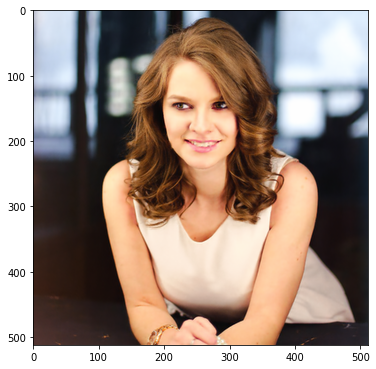

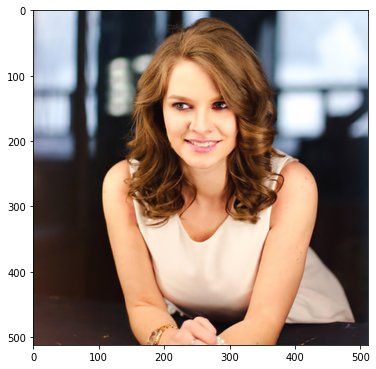

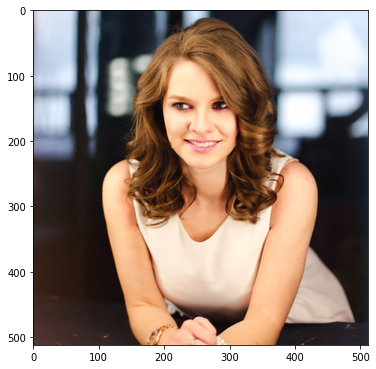

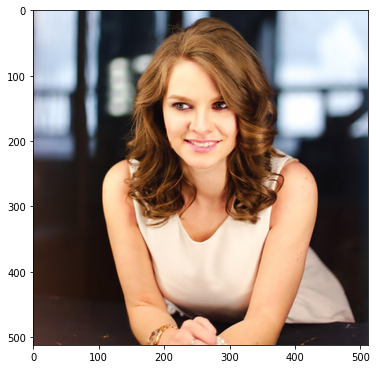

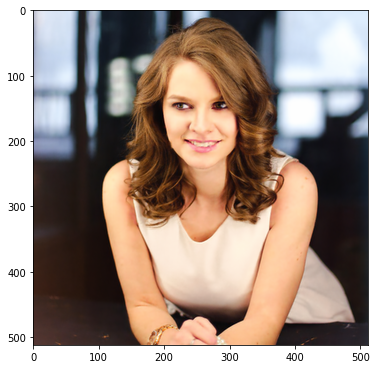

KeyboardInterrupt: ignored

In [40]:
i = 0
loss_storage = []
def closure():
    
    global i
 
    if param_noise:
        for n in [x for x in net.parameters() if len(x.size()) == 4]:
            n = n + n.detach().clone().normal_() * n.std() / 50
    
    net_input = net_input_saved
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
        
        
    out = net(net_input)
   
    total_loss = mse(out * mask_var, img_var * mask_var)
    loss_storage.append(total_loss.item())
    total_loss.backward()
    print ('Iteration %05d    Loss %f' % (i, total_loss.item()), '\r', end='')
      
    if  PLOT and i % show_every == 0:
        out_np = torch_to_np(out)
        plot_image_grid([np.clip(out_np, 0, 1)], factor=figsize, nrow=1)
    
        
    i += 1
 
     
    return total_loss

net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)
print(loss_storage)

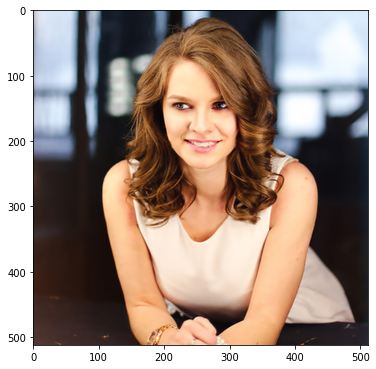

In [34]:
out_np = torch_to_np(net(net_input))
plot_image_grid([out_np], factor=5);